In [1]:
import tensorflow as tf
import numpy as np
import os
import cv2
import matplotlib.pyplot as plt
import random

from sklearn.model_selection import train_test_split
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPool2D, Flatten, ZeroPadding2D, Dense, Input, Activation, Add, BatchNormalization, Dropout, GlobalAveragePooling2D, Dropout, RandomRotation, RandomFlip, RandomTranslation, Rescaling
from keras.applications import MobileNetV2
from keras.utils import plot_model
from keras import models, layers, optimizers
from sklearn.utils.class_weight import compute_class_weight
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Save data directory for inspection
data_dir = "dataset"

In [3]:
def inspect_data_dir(data_dir):
    classes = ['plastic', 'paper', 'organic', 'metal', 'glass']
    stats = {}
    corrupted_files = []

    for cls in classes:
        folder = os.path.join(data_dir, cls)
        if not os.path.exists(folder):
            print(f"Warning: Folder {folder} does not exist")
            stats[cls] = 0
            continue
        
        images = os.listdir(folder)
        valid_images = []
        for img_name in images:
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path)
            if img is None:
                corrupted_files.append(img_path)
            else:
                valid_images.append(img_name)
        
        stats[cls] = len(valid_images)
        print(f"{cls}: {len(valid_images)} images")
    
    return stats, corrupted_files

stats, corrupted_files = inspect_data_dir(data_dir)

if corrupted_files:
    print("\nCorrupted files:")
    for file in corrupted_files:
        print(file)
else:
    print("\nNo corrupted files found.")

plastic: 865 images
paper: 1050 images
organic: 985 images
metal: 769 images
glass: 775 images

No corrupted files found.


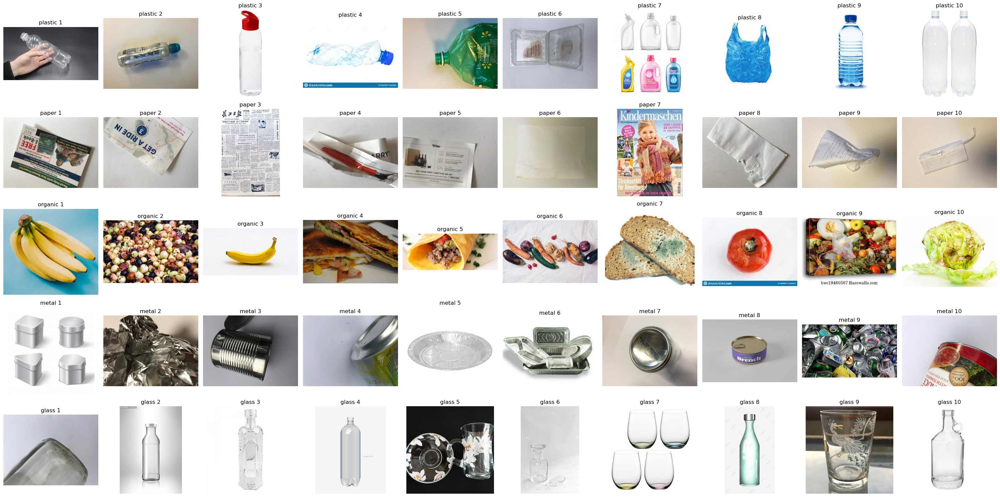

In [4]:
def plot_sample_images_dir(data_dir, num_samples=10):
    classes = ['plastic', 'paper', 'organic', 'metal', 'glass']
    fig, axes = plt.subplots(len(classes), num_samples, figsize=(num_samples * 3, len(classes) * 3))
    
    for i, cls in enumerate(classes):
        folder = os.path.join(data_dir, cls)
        images = [f for f in os.listdir(folder) if cv2.imread(os.path.join(folder, f)) is not None]
        samples = random.sample(images, min(num_samples, len(images)))
        
        for j, img_name in enumerate(samples):
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for plotting
            axes[i, j].imshow(img)
            axes[i, j].set_title(f"{cls} {j+1}")
            axes[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()
    
plot_sample_images_dir(data_dir)

In [5]:
def analyze_image_properties(data_dir):
    classes = ['plastic', 'paper', 'organic', 'metal', 'glass']
    sizes = []
    intensities = []

    for cls in classes:
        folder = os.path.join(data_dir, cls)
        for img_name in os.listdir(folder):
            img_path = os.path.join(folder, img_name)
            img = cv2.imread(img_path)
            if img is not None:
                h, w = img.shape[:2]
                sizes.append((h, w))
                intensity = np.mean(img)  # Mean pixel intensity
                intensities.append(intensity)
    
    # Report statistics
    sizes = np.array(sizes)
    print(f"Image sizes (H, W): Mean={np.mean(sizes, axis=0)}, Std={np.std(sizes, axis=0)}")
    print(f"Pixel intensity: Mean={np.mean(intensities):.2f}, Std={np.std(intensities):.2f}")

analyze_image_properties(data_dir)

Image sizes (H, W): Mean=[279.11026103 351.05333033], Std=[ 89.49465332 134.25063409]
Pixel intensity: Mean=171.45, Std=42.70


In [6]:
# Load dataset using image_dataset_from_directory
dataset = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    image_size=(224, 224),  # Resize to 96x96 for ESP32-S3
    batch_size=32,
    label_mode='int',  # Labels as integers (0=plastic, 1=paper, etc.)
    shuffle=True,
    interpolation='bicubic' # Better for downsizing than default 'bilinear'
)

# Get class names
class_names = dataset.class_names
print("Class names:", class_names)

Found 4444 files belonging to 5 classes.
Class names: ['glass', 'metal', 'organic', 'paper', 'plastic']


In [7]:
def inspect_dataset(dataset, class_names):
    # Count total images
    total_images = sum(1 for _ in dataset.unbatch())
    print(f"Total images: {total_images}")

    # Count images per class
    label_counts = {name: 0 for name in class_names}
    for _, labels in dataset.unbatch():
        label = labels.numpy()
        label_counts[class_names[label]] += 1
    
    print("\nImages per class:")
    for name, count in label_counts.items():
        print(f"{name}: {count} images")
    
    return label_counts

label_counts = inspect_dataset(dataset, class_names)

Total images: 4444

Images per class:
glass: 775 images
metal: 769 images
organic: 985 images
paper: 1050 images
plastic: 865 images


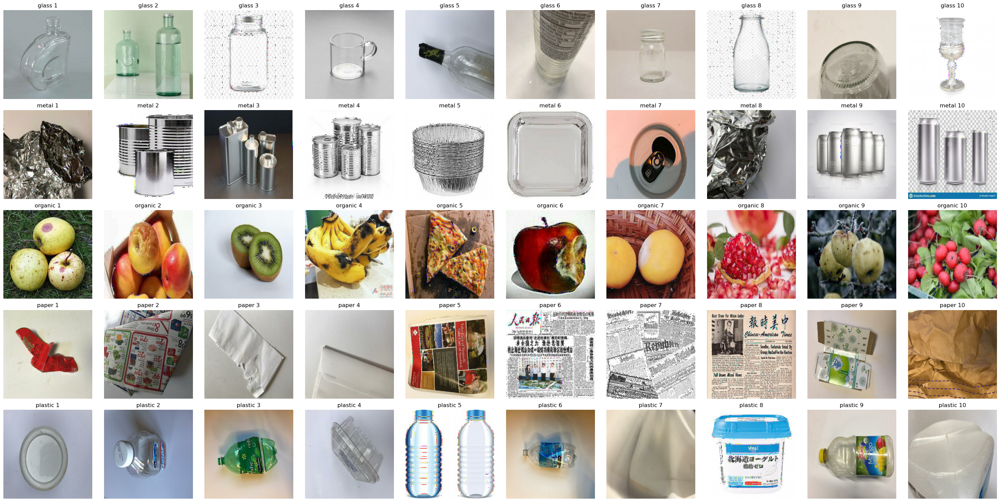

In [8]:
def plot_sample_images(dataset, class_names, num_samples=10):
    # Collect samples per class
    samples = {name: [] for name in class_names}
    for images, labels in dataset.unbatch().take(1000):  # Limit to avoid memory issues
        label = labels.numpy()
        cls = class_names[label]
        if len(samples[cls]) < num_samples:
            samples[cls].append(images.numpy())

    # Plot grid
    fig, axes = plt.subplots(len(class_names), num_samples, figsize=(num_samples * 3, len(class_names) * 3))
    for i, cls in enumerate(class_names):
        for j in range(num_samples):
            if j < len(samples[cls]):
                img = samples[cls][j].astype(np.uint8)  # Convert float32 to uint8
                axes[i, j].imshow(img)
                axes[i, j].set_title(f"{cls} {j+1}")
            axes[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_sample_images(dataset, class_names)

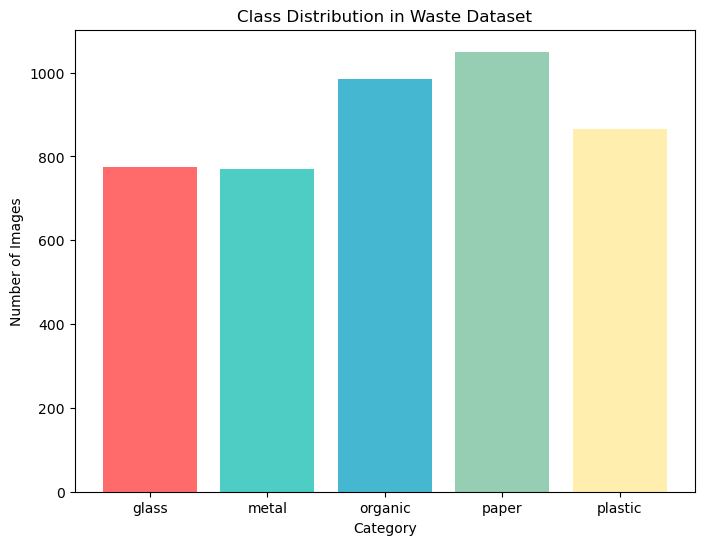

Chart data: [775, 769, 985, 1050, 865]
Chart labels: ['glass', 'metal', 'organic', 'paper', 'plastic']


In [9]:
def plot_class_distribution(label_counts):
    classes = list(label_counts.keys())
    counts = list(label_counts.values())
    
    plt.figure(figsize=(8, 6))
    plt.bar(classes, counts, color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEEAD'])
    plt.xlabel('Category')
    plt.ylabel('Number of Images')
    plt.title('Class Distribution in Waste Dataset')
    plt.show()

    # Chart reference
    print("Chart data:", counts)
    print("Chart labels:", classes)

plot_class_distribution(label_counts)

In [10]:
# Split dataset (80% train, 10% val, 10% test)
def split_dataset(dataset):
    dataset_size = sum(1 for _ in dataset)
    train_size = int(0.8 * dataset_size)
    val_size = int(0.1 * dataset_size)
    test_size = dataset_size - train_size - val_size
    train_ds = dataset.take(train_size)
    val_ds = dataset.skip(train_size).take(val_size)
    test_ds = dataset.skip(train_size + val_size)
    return train_ds, val_ds, test_ds

train_ds, val_ds, test_ds = split_dataset(dataset)
train_ds = train_ds.cache().shuffle(1000).prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(tf.data.AUTOTUNE)
test_ds = test_ds.cache().prefetch(tf.data.AUTOTUNE)

In [11]:
# Build model with augmentation layers
model = Sequential([
    # Augmentation layers
    Rescaling(1./255),  # Normalize to [0,1]
    RandomRotation(0.2),  # Rotate ±20%
    RandomTranslation(0.2, 0.2),  # Shift ±20%
    RandomFlip("horizontal"),  # Horizontal flip
    # Pretrained MobileNetV2
    MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet'),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(5, activation='softmax')  # 5 classes
])
model.layers[4].trainable = False  # Freeze MobileNetV2 layer(base model)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 13s 1us/step


In [13]:
# Compute class weights
y_train = np.array([y.numpy() for x, y in train_ds.unbatch()])  # Convert TensorFlow tensors to numpy arrays
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = dict(enumerate(class_weights))

In [14]:
# Callbacks
checkpoint = ModelCheckpoint("best_model.keras", monitor='val_accuracy', save_best_only=True)
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2)

In [15]:
# Compile and train
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    class_weight=class_weight_dict,
    callbacks=[checkpoint, early_stopping, reduce_lr]
)

Epoch 1/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - accuracy: 0.6378 - loss: 0.9947 - val_accuracy: 0.8413 - val_loss: 0.4197 - learning_rate: 0.0010
Epoch 2/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 175s 2s/step - accuracy: 0.8451 - loss: 0.4452 - val_accuracy: 0.8726 - val_loss: 0.3488 - learning_rate: 0.0010
Epoch 3/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 128s 1s/step - accuracy: 0.8529 - loss: 0.3921 - val_accuracy: 0.8702 - val_loss: 0.3092 - learning_rate: 0.0010
Epoch 4/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 130s 1s/step - accuracy: 0.8730 - loss: 0.3547 - val_accuracy: 0.8654 - val_loss: 0.3016 - learning_rate: 0.0010
Epoch 5/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 135s 1s/step - accuracy: 0.8928 - loss: 0.3053 - val_accuracy: 0.9014 - val_loss: 0.2531 - learning_rate: 0.0010
Epoch 6/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 142s 1s/step - accuracy: 0.8873 - loss: 0.3202 - val_accuracy: 0.9159 - val_loss: 0.2143 - learning_rate: 0.0010
Epoch 7/10
111/111 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - accuracy: 0.8881 - loss: 0.

In [16]:
# Evaluate
test_loss, test_accuracy = model.evaluate(test_ds)
print(f"Test accuracy: {test_accuracy:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 18s 790ms/step - accuracy: 0.9053 - loss: 0.2405
Test accuracy: 0.9034


In [18]:
# Get predictions
y_pred = model.predict(test_ds)
y_pred_classes = np.argmax(y_pred, axis=1)

# Extract true labels correctly
y_true = []
for x, y in test_ds.unbatch():
    # Convert tensor to numpy and append to list
    y_true.append(y.numpy())
y_true = np.array(y_true)

# Print metrics
print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_names))
print("Confusion Matrix:")
print(confusion_matrix(y_true, y_pred_classes))

15/15 ━━━━━━━━━━━━━━━━━━━━ 12s 798ms/step
Classification Report:
              precision    recall  f1-score   support

       glass       0.83      0.86      0.84        79
       metal       0.80      0.90      0.85        82
     organic       1.00      0.98      0.99       115
       paper       0.99      0.94      0.97       107
     plastic       0.85      0.80      0.82        93

    accuracy                           0.90       476
   macro avg       0.89      0.90      0.90       476
weighted avg       0.91      0.90      0.90       476

Confusion Matrix:
[[ 68   6   0   0   5]
 [  3  74   0   0   5]
 [  0   1 113   0   1]
 [  1   3   0 101   2]
 [ 10   8   0   1  74]]


In [22]:
# Save model in Keras format
model.save("./model/waste_model.keras")
print("Model saved as waste_model.keras")
model.save("./model/waste_model.h5")
print("Model saved as waste_model.h5")

Model saved as waste_model.keras
Model saved as waste_model.h5


In [24]:
# Convert to TFLite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_types = [tf.int8]
converter.inference_input_type = tf.int8
converter.inference_output_type = tf.int8

# Fix: Create a proper representative dataset generator function that yields one example at a time
def representative_dataset_gen():
    classes = ['plastic', 'paper', 'organic', 'metal', 'glass']
    for cls in classes:
        for img_name in os.listdir(os.path.join(data_dir, cls))[:10]:
            img_path = os.path.join(data_dir, cls, img_name)
            img = cv2.imread(img_path)
            img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_CUBIC)
            img = np.expand_dims(img, axis=0).astype(np.float32) / 255.0
            yield [img]  # Note: yield one example at a time

converter.representative_dataset = representative_dataset_gen
tflite_model = converter.convert()

# Save TFLite model
with open("./model/waste_model.tflite", "wb") as f:
    f.write(tflite_model)
print("Model saved as waste_model.tflite")

INFO:tensorflow:Assets written to: C:\Users\USER\AppData\Local\Temp\tmpnvoety19\assets


INFO:tensorflow:Assets written to: C:\Users\USER\AppData\Local\Temp\tmpnvoety19\assets


Saved artifact at 'C:\Users\USER\AppData\Local\Temp\tmpnvoety19'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_154')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  2805205836880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805205836304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805205834192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805205836688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805205836496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805205834960: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805280284048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805280283664: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805280282512: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2805280283856: TensorSpec(shape=(), dtype=tf.resource, name=None)
  28

In [26]:
# Verify saved models
loaded_model = tf.keras.models.load_model("./model/waste_model.keras")
test_loss_loaded, test_accuracy_loaded = loaded_model.evaluate(test_ds)
print(f"Loaded model test accuracy: {test_accuracy_loaded:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 14s 752ms/step - accuracy: 0.9053 - loss: 0.2405
Loaded model test accuracy: 0.9034
